# Example photometry-wcs matching

This notebook goes through an example of extracting photometry from a field, cross-matching it with 2MASS, and deriving a distorted WCS solution from that.

A note we didn't talk about yet: in principle, the distortion should be constant for each filter: we should only need to measure the distortion for the J, H, K, and H2 filters; once we've done that, we can apply the measured distortion to every image.

This means that *each* image gives *independent* information about the distortion correction: each image has stars landing in different parts of the field-of-view.

We can therefore combine our crossmatched images together to derive the appropriate polynomial distortion corrections!

This is what we should do, but it will be a little tricky b/c we can't just use the fit_wcs function

In [1]:
cd GTC2-20AFLO/OB0001/object

/orange/adamginsburg/w51/gtc/GTC2-20AFLO/OB0001/object


In [2]:
files = !ls *fits

In [140]:
len(files)

234

In [3]:
files[0]

'0002613543-20200712-EMIR-STARE_IMAGE.fits'

In [4]:
from astropy.io import fits

In [5]:
filehandle = fits.open(files[0])

In [6]:
filehandle

In [7]:
from astropy.wcs import WCS

In [38]:
filehandle[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 2048 / length of data axis 1                          
NAXIS2  =                 2048 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
BZERO   =                32768 / offset data range to that of unsigned short    
BSCALE  =                    1 / default scaling factor                         
DETVER  = 'SCI     '           / 401 Detector used: science or engineering      
NSEC    =                    1 / 402 Number of sequences executed at detector   
NRST    =                   

In [246]:
filehandle[0].header['FILTER']

'J'

In [8]:
ww = WCS(filehandle[0].header)

In [9]:
%matplotlib inline
import pylab as pl
from astropy import visualization
pl.style.use('dark_background')

In /orange/adamginsburg/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /orange/adamginsburg/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /orange/adamginsburg/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /orange/adamginsburg/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /orange/adamginsburg/

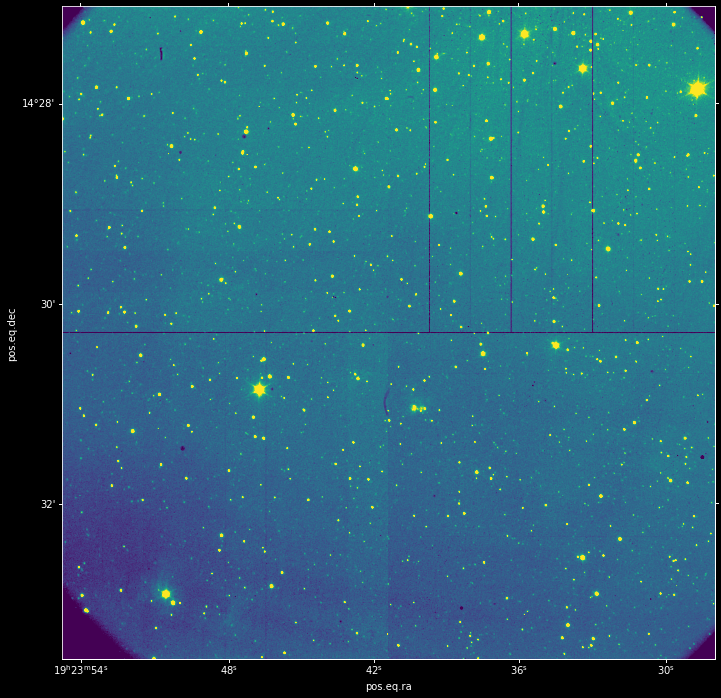

In [40]:
# https://docs.astropy.org/en/stable/visualization/wcsaxes/
pl.figure(figsize=(12,12))
pl.subplot(projection=ww) # this line makes the image show up with RA/Dec coordinates
pl.imshow(filehandle[0].data,
          norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.5))

In [11]:
from astroquery.vizier import Vizier
from astropy import coordinates, units as u

In [41]:
# cx, cy are 1024
cy, cx = (x/2 for x in filehandle[0].data.shape)
cx, cy

(1024.0, 1024.0)

In [43]:
ra, dec = ww.wcs_pix2world(cx, cy, 0)*u.deg
ra, dec

(<Quantity 290.92240637 deg>, <Quantity 14.50477208 deg>)

In [44]:
center = coordinates.SkyCoord(ra, dec, frame='fk5')
center

<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.92240637, 14.50477208)>

In [46]:
tables = Vizier(row_limit=10000).query_region(center, radius=5*u.arcmin, catalog='2MASS')
tables

TableList with 2 tables:
	'0:II/246/out' with 15 column(s) and 1716 row(s) 
	'1:VII/233/xsc' with 13 column(s) and 12 row(s) 

In [47]:
table = tables[0]

In [48]:
table.meta

{'ID': 'II_246_out',
 'name': 'II/246/out',
 'description': '2MASS Point Source Catalogue, output (on a total of 470,992,970 sources)'}

In [14]:
table

RAJ2000,DEJ2000,_2MASS,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag,Qflg,Rflg,Bflg,Cflg,Xflg,Aflg
deg,deg,,mag,mag,mag,mag,mag,mag,,,,,,
float64,float64,str17,float32,float32,float32,float32,float32,float32,str3,str3,str3,str3,uint8,uint8
290.874978,14.435305,19232999+1426070,14.476,0.036,13.782,0.041,13.563,0.048,AAA,222,111,00c,0,0
290.911328,14.430030,19233871+1425481,15.728,0.078,14.998,0.097,14.772,0.120,AAB,222,111,000,0,0
290.910689,14.434605,19233856+1426045,15.396,0.076,14.463,0.072,13.956,0.060,AAA,222,111,ccc,0,0
290.911945,14.427302,19233886+1425382,13.687,0.031,12.443,0.029,12.022,0.026,AAA,222,111,000,0,0
290.909739,14.426192,19233833+1425342,15.914,0.131,14.949,0.143,14.223,0.124,BBB,222,111,c00,0,0
290.911764,14.424986,19233882+1425299,13.565,0.032,12.843,0.040,12.515,0.034,AAA,222,111,000,0,0
290.912462,14.432902,19233899+1425584,15.786,0.076,15.000,0.089,14.768,0.129,AAB,222,111,000,0,0
290.909358,14.423078,19233824+1425230,14.609,0.035,14.240,0.069,14.074,0.087,AAA,222,121,0cc,0,0


In [15]:
table_coordinates = coordinates.SkyCoord(table['RAJ2000'], table['DEJ2000'], frame='fk5')

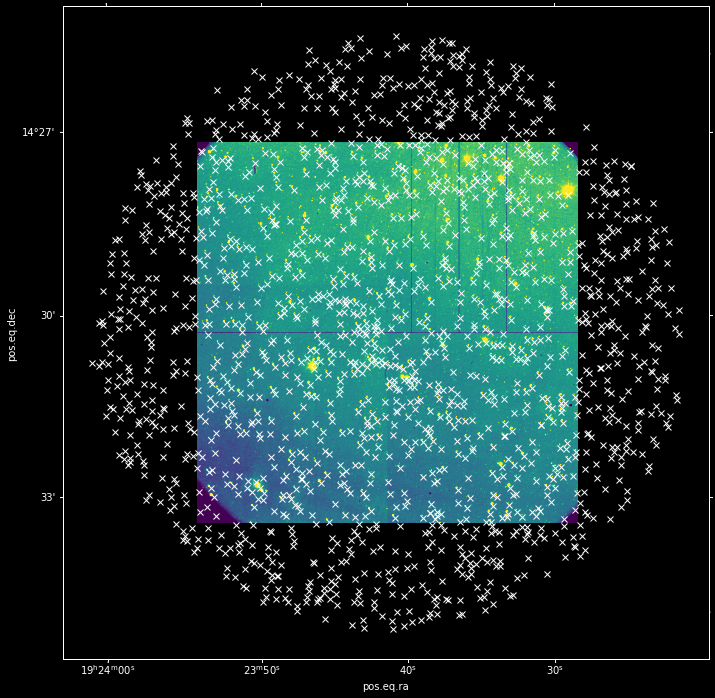

In [16]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.5))
pl.plot(table_coordinates.ra, table_coordinates.dec, transform=ax.get_transform('world'), marker='x', color='w', linestyle='none')

(-0.5, 2047.5, -0.5, 2047.5)

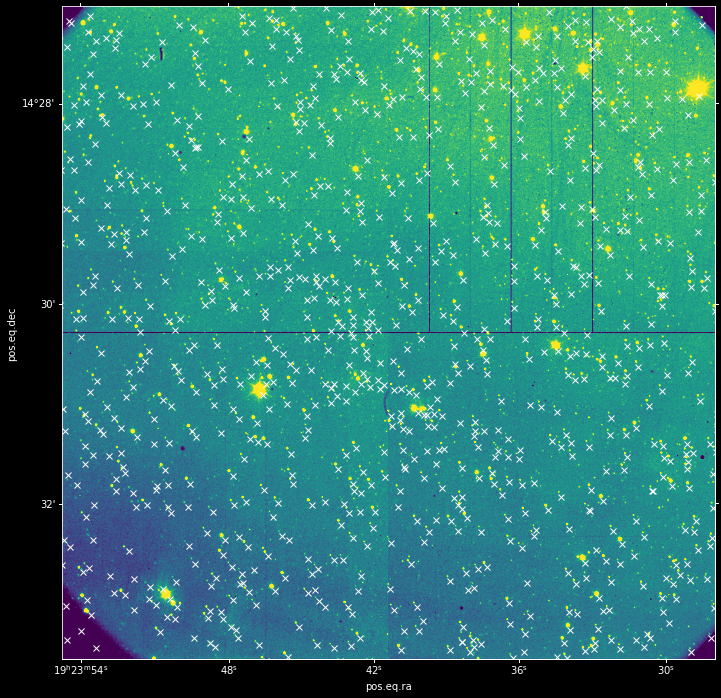

In [50]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99))
axlims = ax.axis()
pl.plot(table_coordinates.ra, table_coordinates.dec, transform=ax.get_transform('world'), marker='x', color='w', linestyle='none')
ax.axis(axlims)

In [53]:
brightstars = table['Jmag'] < 12
brightstars.sum()

36

(-0.5, 2047.5, -0.5, 2047.5)

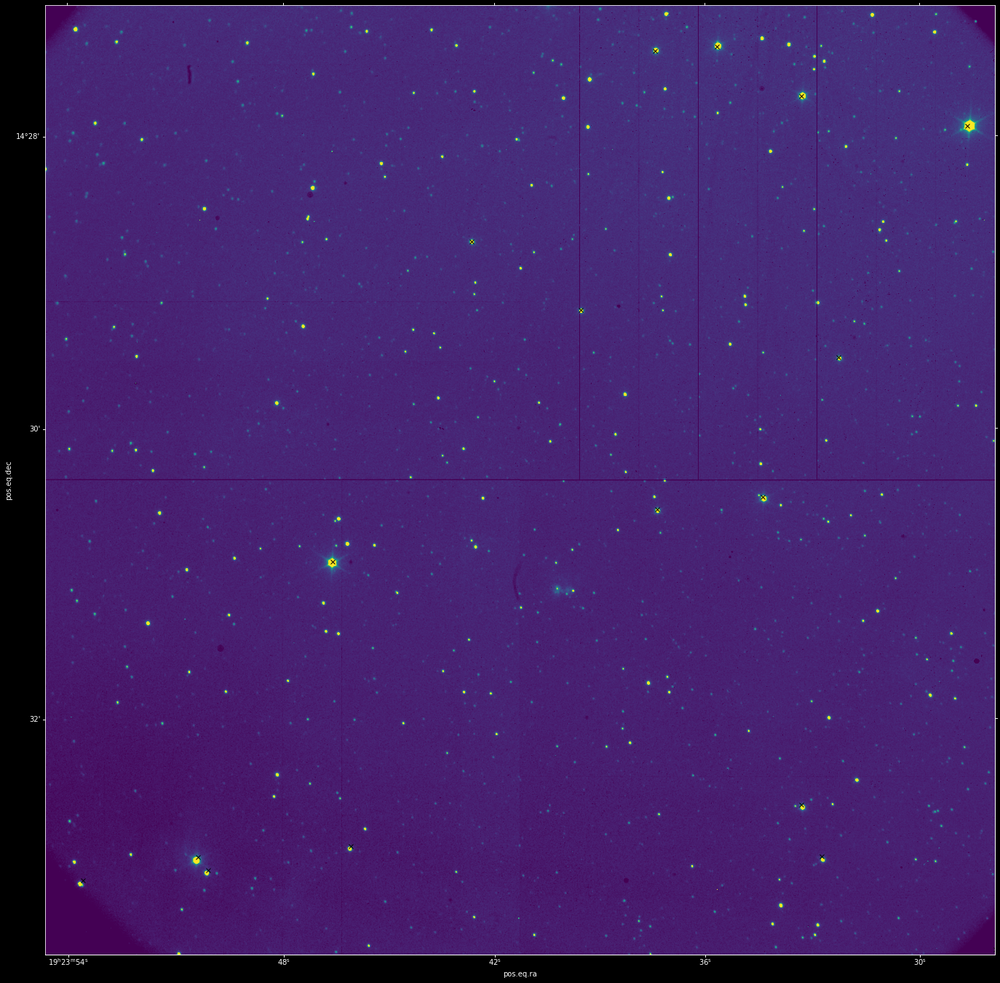

In [223]:
# because the offset was so bad, I decided to try to fix the WCS a little before doing cross-matching
# the code below re-loads the WCS, then shifts it up by 4" and left by 1.8"
ww = WCS(filehandle[0].header)
ww.wcs.crval[1] += 4/3600
ww.wcs.crval[0] -= 1.8/3600


pl.figure(figsize=(24,24))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
axlims = ax.axis()
pl.plot(table_coordinates.ra[brightstars],
        table_coordinates.dec[brightstars],
        transform=ax.get_transform('world'), marker='x', color='k', linestyle='none')
ax.axis(axlims)

Photutils starfinder documentation:
https://photutils.readthedocs.io/en/stable/api/photutils.detection.DAOStarFinder.html#photutils.detection.DAOStarFinder
https://photutils.readthedocs.io/en/stable/detection.html

In [224]:
from photutils import DAOStarFinder
std = filehandle[0].data.std() # crummy guess!!
daofind = DAOStarFinder(fwhm=3.0, threshold=4.*std)

In [225]:
starcat = daofind(filehandle[0].data - np.median(filehandle[0].data)) 

In [226]:
starcat

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
1,287.9700850298652,1.2254191487573212,0.33898971523659666,-0.5043428195278257,-0.19042148910976217,25,0.0,26395.0,6.457621293501058,-2.0251814306880984
2,1304.852235218743,1.113840202997082,0.40321710648281145,-0.6484855477273462,-0.04932858618029747,25,0.0,7659.0,2.0685111856434135,-0.7891446843020283
3,697.4116669665292,18.885942959230643,0.47425713996387714,-0.2559906975476679,0.2862179409777722,25,0.0,11878.0,2.381043379974144,-0.9419182696039424
4,1633.1442249028848,36.260950144180846,0.4729770426104424,-0.270485878631732,0.2905947206753293,25,0.0,5976.0,1.4378440943787447,-0.3942794949820389
5,1054.3503310555595,42.16164821607824,0.5528082056736704,-0.21750124549436936,0.282758525447906,25,0.0,14655.0,2.9647567175065572,-1.179972654386196
6,1659.5769719916764,41.96614194132806,0.4830505140481155,-0.21385372678165798,0.14257078637228587,25,0.0,14959.0,3.1769179812948596,-1.2550150069050916
7,1304.4557964903947,60.36701941413607,0.5068753445411941,0.08080003897044317,0.1967237310078239,25,0.0,4724.0,1.0701561795540757,-0.0736179090935071
8,1665.9293754741275,63.25521116947896,0.4614668196739984,-0.12018632178813585,0.3891364880454739,25,0.0,31810.0,6.689247363387615,-2.0634431403405187
9,1568.3300173689129,65.63227304051547,0.4655856461961491,-0.46180923109789446,0.29740136720755156,25,0.0,20312.0,4.01973648378026,-1.5104939589603954


(-0.5, 2047.5, -0.5, 2047.5)

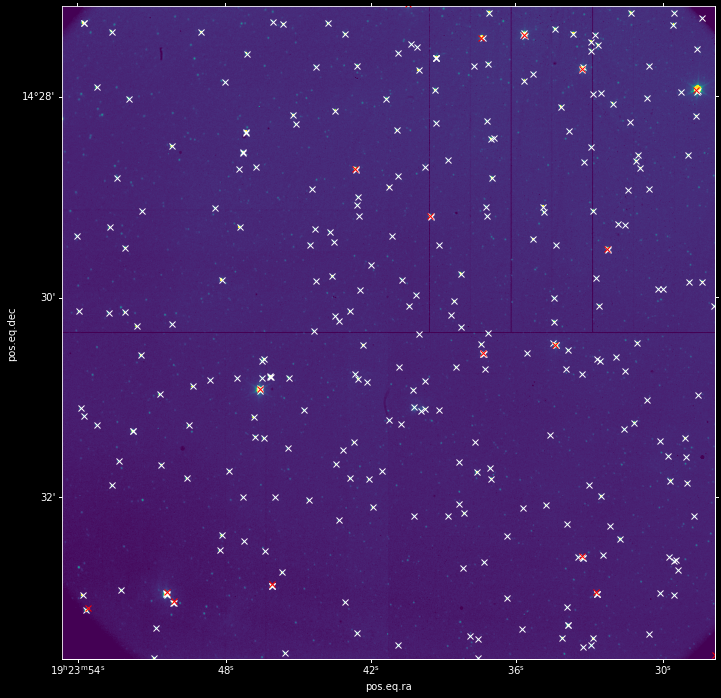

In [227]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wx')
pl.plot(table_coordinates.ra[brightstars],
        table_coordinates.dec[brightstars],
        transform=ax.get_transform('world'), marker='x', color='r', linestyle='none')
ax.axis(axlims)

In [228]:
xc, yc = ww.all_world2pix(table_coordinates.ra, table_coordinates.dec, 0)

In [247]:
ra, dec = ww.all_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

In [230]:
starfind_coords = coordinates.SkyCoord(ra, dec, frame='fk5')

In [231]:
starfind_coords.shape, table_coordinates.shape

((306,), (1716,))

In [232]:
match_index, match_distance, _ = coordinates.match_coordinates_sky(starfind_coords, table_coordinates)

(array([234.,  65.,   4.,   0.,   1.,   0.,   0.,   0.,   1.,   1.]),
 array([0.04816839, 1.03560097, 2.02303355, 3.01046613, 3.9978987 ,
        4.98533128, 5.97276386, 6.96019644, 7.94762901, 8.93506159,
        9.92249417]),
 <BarContainer object of 10 artists>)

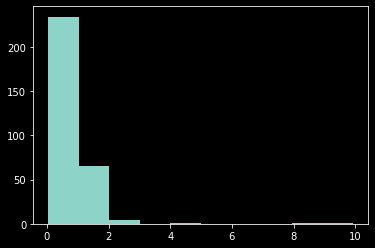

In [233]:
pl.hist(match_distance.to(u.arcsec).value)

In [234]:
new_sky_coordinates = table_coordinates[match_index]
new_sky_coordinates_xy = ww.all_world2pix(new_sky_coordinates.ra, new_sky_coordinates.dec, 0)

(-0.5, 2047.5, -0.5, 2047.5)

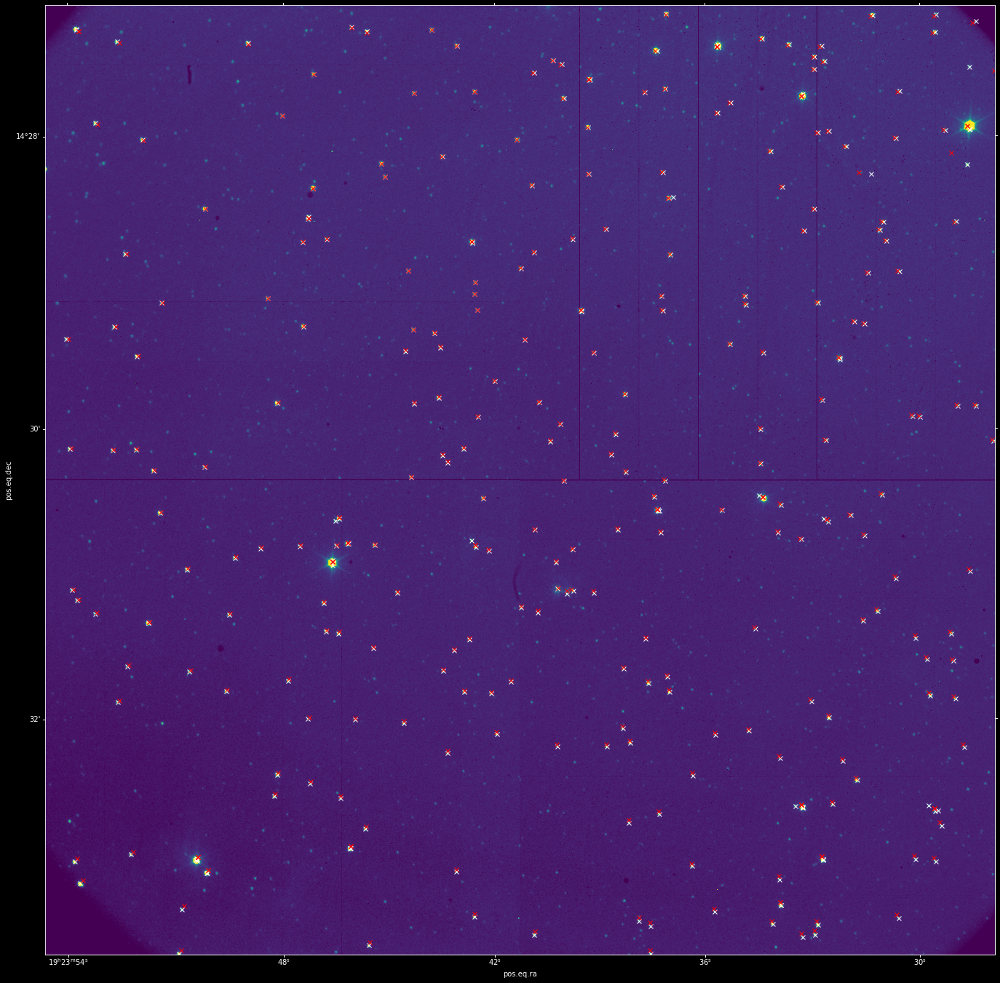

In [235]:
pl.figure(figsize=(24,24))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wx')
pl.plot(new_sky_coordinates_xy[0], new_sky_coordinates_xy[1], 'rx')
ax.axis(axlims)

In [236]:
from astropy.wcs.utils import fit_wcs_from_points

In [237]:
xy_starfind = np.array([starcat['xcentroid'], starcat['ycentroid']])

In [238]:
new_wcs = fit_wcs_from_points(xy_starfind, new_sky_coordinates, sip_degree=2)

In [239]:
new_wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP'  'DEC--TAN-SIP'  
CRVAL : 290.9207853485614  14.506229880371471  
CRPIX : 1045.7754298613622  1015.7409045073978  
CD1_1 CD1_2  : -5.3267256719998046e-05  -4.984211132715454e-09  
CD2_1 CD2_2  : 5.483835322691893e-09  -5.323166184964617e-05  
NAXIS : 2000.7783858533226  2028.2073632349282

In [240]:
new_ra, new_dec = new_wcs.wcs_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

In [241]:
visualization.quantity_support()

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x2ae85107d7b8>

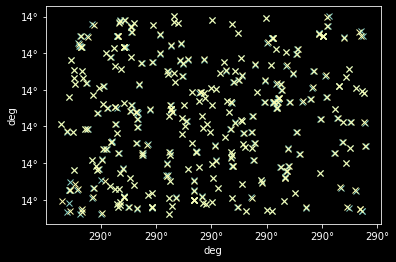

In [242]:
pl.plot(new_ra, new_dec, 'x')
pl.plot(new_sky_coordinates.ra, new_sky_coordinates.dec, 'x')

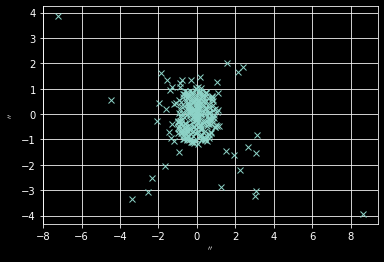

In [248]:
ra_residual = (new_ra-new_sky_coordinates.ra).to(u.arcsec)
dec_residual = (new_dec-new_sky_coordinates.dec).to(u.arcsec)
pl.plot(ra_residual, dec_residual, 'x')
pl.grid()

In [249]:
bad_matches = (ra_residual < -2*u.arcsec) | (ra_residual > 2*u.arcsec) | (dec_residual > 2*u.arcsec) | (dec_residual < -2*u.arcsec)
bad_matches.sum(), len(bad_matches)

(18, 306)

In [285]:
xy_starfind2 = xy_starfind.T[~bad_matches].T
new_sky_coordinates2 = new_sky_coordinates.T[~bad_matches].T
new_wcs2 = fit_wcs_from_points(xy_starfind2, new_sky_coordinates2, sip_degree=3)

In [286]:
new_ra2, new_dec2 = new_wcs2.wcs_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

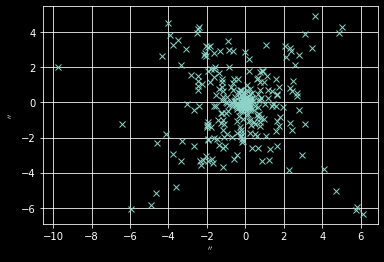

In [287]:
ra_residual2 = (new_ra2-new_sky_coordinates.ra).to(u.arcsec)
dec_residual2 = (new_dec2-new_sky_coordinates.dec).to(u.arcsec)
pl.plot(ra_residual2, dec_residual2, 'x')
pl.grid()

In [288]:
new_wcs2

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP'  'DEC--TAN-SIP'  
CRVAL : 290.9207853485614  14.506229880371471  
CRPIX : 1045.9486807512487  1016.101600741903  
CD1_1 CD1_2  : -5.399683343456797e-05  -1.7692217065600958e-09  
CD2_1 CD2_2  : 4.061043497272642e-08  -5.403636528255915e-05  
NAXIS : 2000.7783858533226  2028.2073632349282

(-0.5, 2047.5, -0.5, 2047.5)

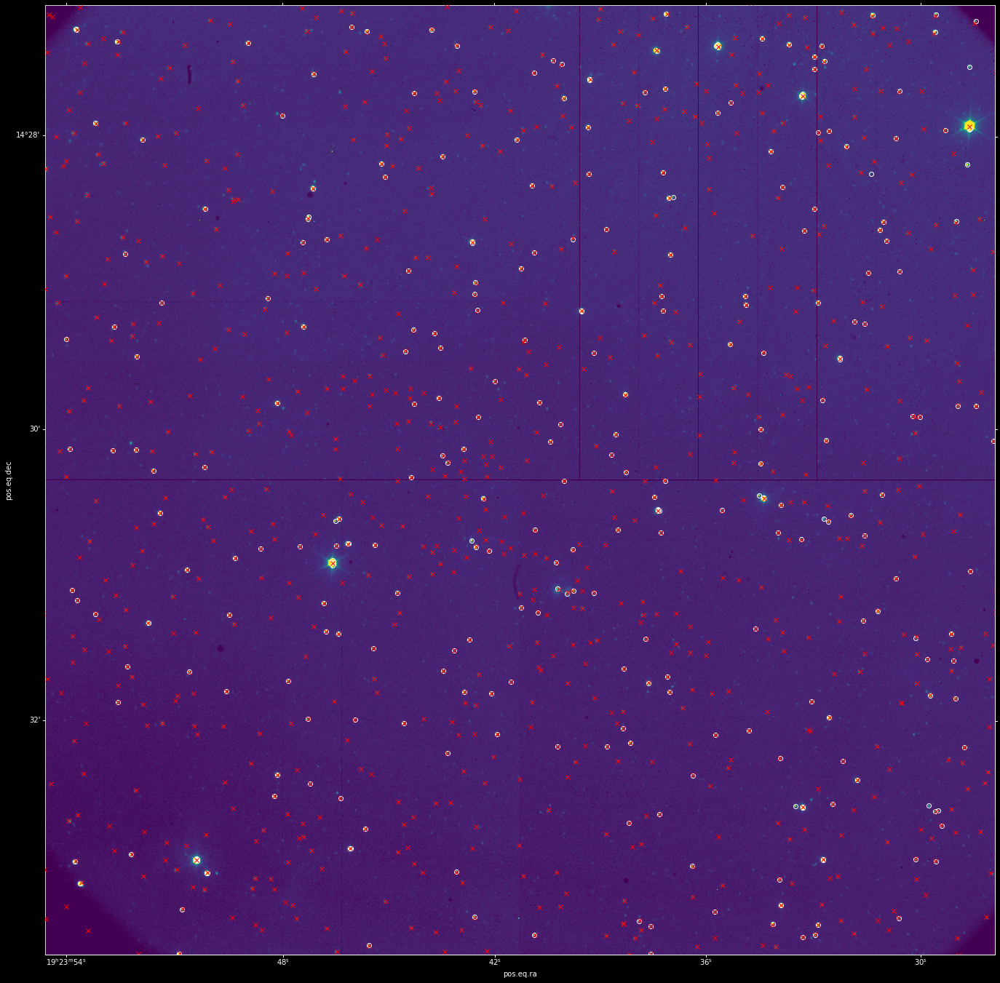

In [289]:
pl.figure(figsize=(24,24))
ax = pl.subplot(projection=new_wcs2)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wo', markeredgecolor='w', markerfacecolor='none')
pl.plot(table_coordinates.ra,
        table_coordinates.dec,
        transform=ax.get_transform('world'), marker='x', color='r', linestyle='none')
ax.axis(axlims)

This next plot shows the per-star shifts:

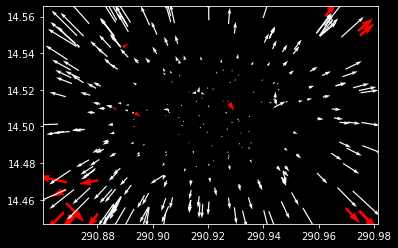

In [290]:
#pl.quiver(new_ra.value, new_dec.value, ra_residual2.value, dec_residual2.value, color='w')
pl.quiver(new_ra.value[bad_matches], new_dec.value[bad_matches], ra_residual2.value[bad_matches], dec_residual2.value[bad_matches], color='r')
pl.quiver(new_ra.value[~bad_matches], new_dec.value[~bad_matches], ra_residual2.value[~bad_matches], dec_residual2.value[~bad_matches], color='w')

This next pot shows the distortion model we fitted, in pixel coordinates:

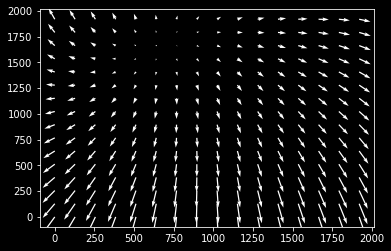

In [291]:
ygrid, xgrid = np.mgrid[0:2048:128, 0:2048:128]
r1,d1 = ww.all_pix2world(xgrid, ygrid, 0)
r2,d2 = new_wcs2.all_pix2world(xgrid, ygrid, 0)
pl.quiver(xgrid, ygrid, r2-r1, d2-d1, color='w')

This one shows the distortion in pixel coordinates instead of RA/Dec coordinates.  It doesn't make much sense to me.

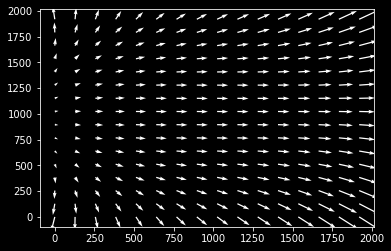

In [292]:
ygrid, xgrid = np.mgrid[0:2048:128, 0:2048:128]
# this doesn't do anything because the original "ww" didn't have SIP coefficients (x1 == xgrid exactly)
x1,y1 = ww.sip_pix2foc(xgrid, ygrid, 0)
# `sip_pix2foc` returns locations relative to crpix, so we redefine x1,x2 to be relative to crpix
x1,y1 = xgrid - ww.wcs.crpix[0], ygrid - ww.wcs.crpix[1]
x2,y2 = new_wcs2.sip_pix2foc(xgrid, ygrid, 0)
pl.quiver(xgrid, ygrid, x1-x2, y1-y2, color='w')